# Notebook for using sklearn packages and implementing Linear Models

In [1]:
import sys
sys.path.append("../scripts")

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.graph_objects as go

from linear_models import *
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.cross_decomposition import PLSRegression
from sklearn.linear_model import Ridge, Lasso, LinearRegression, ElasticNet
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Real

pd.set_option('display.max_columns', None)
plt.style.use('seaborn')

## Splitting and scaling

In [26]:
df = pd.read_pickle("../data/processed/SRD_Lysekil.pkl")
df = df[df['Status'] == 'Stable'].drop(columns=['Status'])
#df = df.drop(columns=['Status'])

X_train, X_test, y_train, y_test = split_data(df, method="none")
plot_training_test(X_train, y_train, X_test, y_test)

scaler = StandardScaler()
cols = [col for col in X_train.columns if col != 'Time']
X_train[cols] = scaler.fit_transform(X_train[cols])
X_test[cols] = scaler.transform(X_test[cols])
print(f"The testing set is {100*y_test.shape[0]/df.shape[0]:.1f}% of the original dataset")

The testing set is 20.0% of the original dataset


## Principal Component Analysis

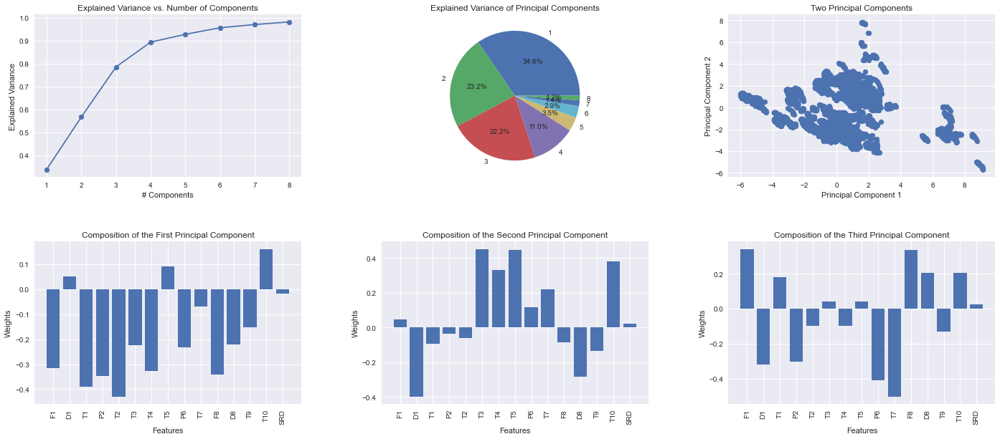

In [27]:
from sklearn.decomposition import PCA
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

pca_scaler = StandardScaler()
df_scaled = df.copy()
df_scaled[cols] = pca_scaler.fit_transform(df[cols])

n = 8
pca = PCA(n_components=n)
pca.fit(df_scaled.iloc[:, 1:])
exp_var_cumul = np.cumsum(pca.explained_variance_ratio_)
fig, axs = plt.subplots(2, 3, figsize=(24, 10))

# Plot 1: Explained Variance vs. Number of Components
axs[0, 0].plot(range(1, n+1), exp_var_cumul)
axs[0, 0].scatter(range(1, n+1), exp_var_cumul, marker='o')
axs[0, 0].set_xlabel("# Components")
axs[0, 0].set_ylabel("Explained Variance")
axs[0, 0].set_title("Explained Variance vs. Number of Components")

# Plot 2: Explained Variance of Principal Components, Pie Chart
axs[0, 1].pie(pca.explained_variance_ratio_, labels=range(1, n+1), autopct='%1.1f%%')
axs[0, 1].set_title("Explained Variance of Principal Components")

# Plot 3: Two Principal Components
principal_components = pca.transform(df_scaled.iloc[:, 1:])
axs[0, 2].scatter(principal_components[:, 0], principal_components[:, 1])
axs[0, 2].set_xlabel("Principal Component 1")
axs[0, 2].set_ylabel("Principal Component 2")
axs[0, 2].set_title("Two Principal Components")

# Plot 4: Composition of the First Principal Component
component_weights = pca.components_[0]
axs[1, 0].bar(range(len(component_weights)), component_weights)
axs[1, 0].set_xticks(range(len(component_weights)))
axs[1, 0].set_xticklabels(df_scaled.columns[1:], rotation=90)
axs[1, 0].set_xlabel("Features")
axs[1, 0].set_ylabel("Weights")
axs[1, 0].set_title("Composition of the First Principal Component")

# Plot 5: Composition of the Second Principal Component
component_weights = pca.components_[1]
axs[1, 1].bar(range(len(component_weights)), component_weights)
axs[1, 1].set_xticks(range(len(component_weights)))
axs[1, 1].set_xticklabels(df_scaled.columns[1:], rotation=90)
axs[1, 1].set_xlabel("Features")
axs[1, 1].set_ylabel("Weights")
axs[1, 1].set_title("Composition of the Second Principal Component")

# Plot 6: Composition of the Third Principal Component
component_weights = pca.components_[2]
axs[1, 2].bar(range(len(component_weights)), component_weights)
axs[1, 2].set_xticks(range(len(component_weights)))
axs[1, 2].set_xticklabels(df_scaled.columns[1:], rotation=90)
axs[1, 2].set_xlabel("Features")
axs[1, 2].set_ylabel("Weights")
axs[1, 2].set_title("Composition of the Third Principal Component")

# Add space between the plots
plt.subplots_adjust(wspace=0.3, hspace=0.4)
plt.show()

## Ordinary Linear Regression

13 out of 14 variables were selected during SFS
Best variables: ('F1', 'D1', 'T1', 'P2', 'T2', 'T4', 'T5', 'P6', 'T7', 'F8', 'D8', 'T9', 'T10')
Best hyperparameters: OrderedDict([('sfs__floating', True), ('sfs__forward', True)])
--------------------------------------------
Best RMSE on the left out data: 0.07032582249700112
Best RMSE on test: 0.09676215185827133


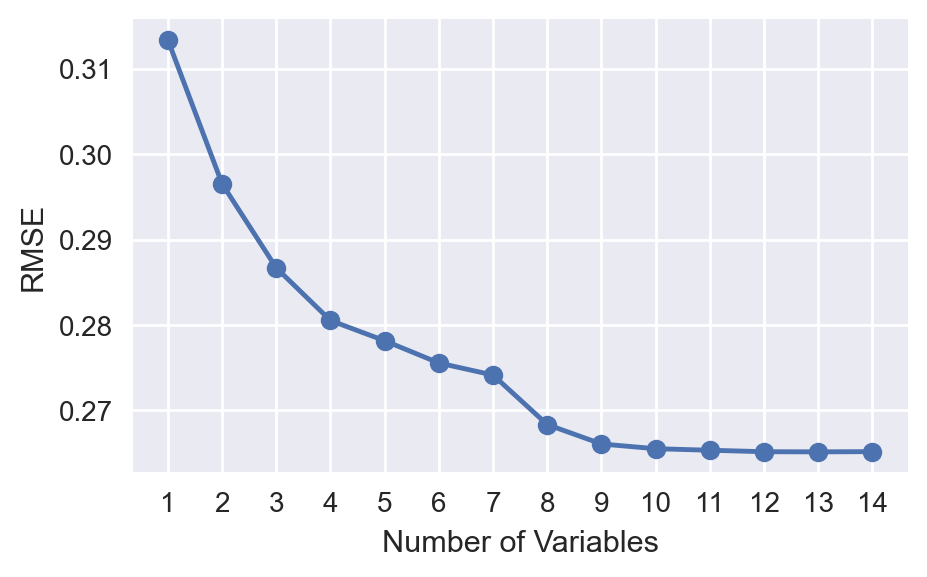

In [28]:
ols1 = LinearRegression()
ols2 = LinearRegression()

sfs = SFS(ols1, 
          k_features='best', 
          forward=False, 
          scoring='neg_root_mean_squared_error', 
          cv=5, 
          n_jobs=-1)

pipe = Pipeline([('sfs', sfs), 
                 ('ols2', ols2)])

bs = BayesSearchCV(pipe,
                   {
                        'sfs__forward': [True, False],
                        'sfs__floating': [True, False],
                   }, 
                   n_iter=1,
                   cv=5, 
                   scoring='neg_root_mean_squared_error',
                   random_state=0)

bs = bs.fit(X_train.drop("Time", axis=1), y_train)
SFS_results(X_train, X_test, y_test, bs, "OLS_SFS_RMSE_Variables.pdf")

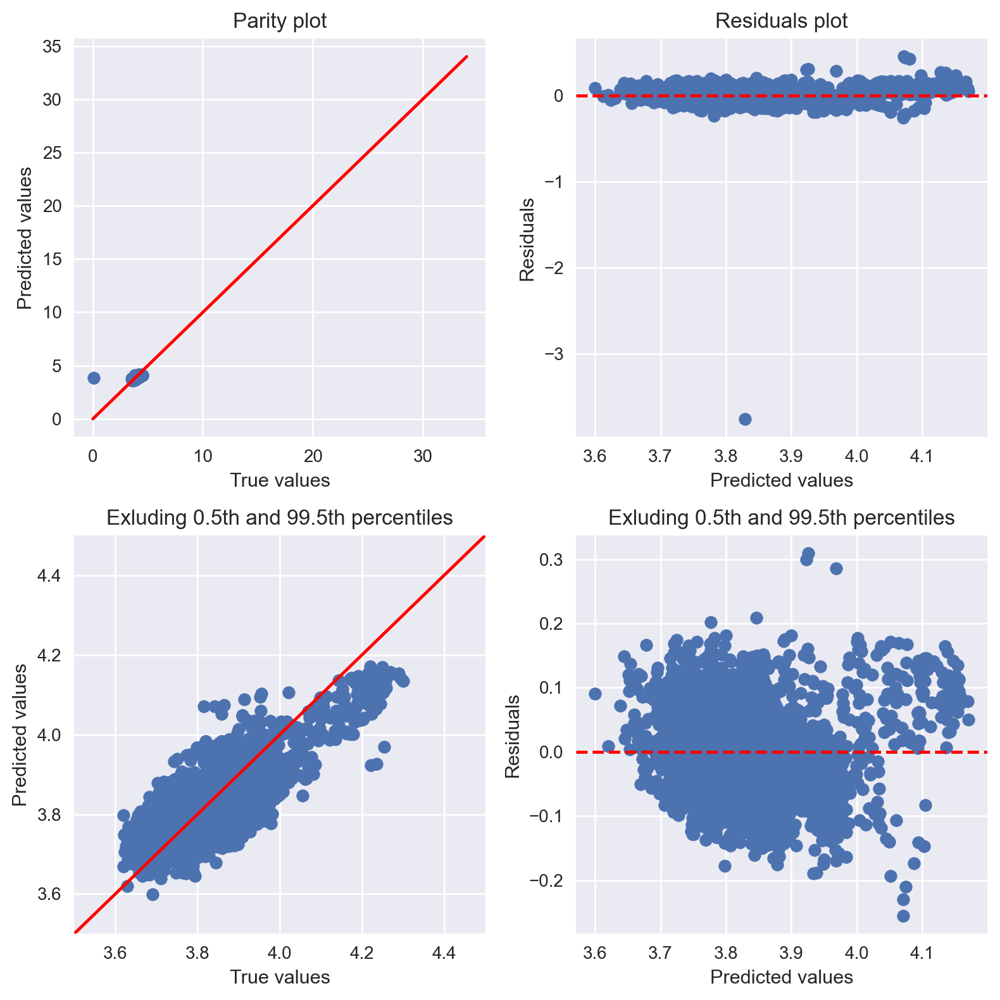

In [29]:
plot_coefficients(bs, 'ols2', "OLS_SFS_Coefficients.pdf")
plot_parity_residual(X_test, y_test, bs, "OLS_SFS_Parity_Residuals.pdf", rng=[3.5, 4.5])
plot_prediction(df, X_train, X_test, bs)

### Only temperatures

4 out of 4 variables were selected during SFS
Best variables: ('T1', 'T4', 'T5', 'T10')
Best hyperparameters: OrderedDict([('sfs__floating', True), ('sfs__forward', True)])
--------------------------------------------
Best RMSE on the left out data: 0.0888110488736395
Best RMSE on test: 0.11239979168895381


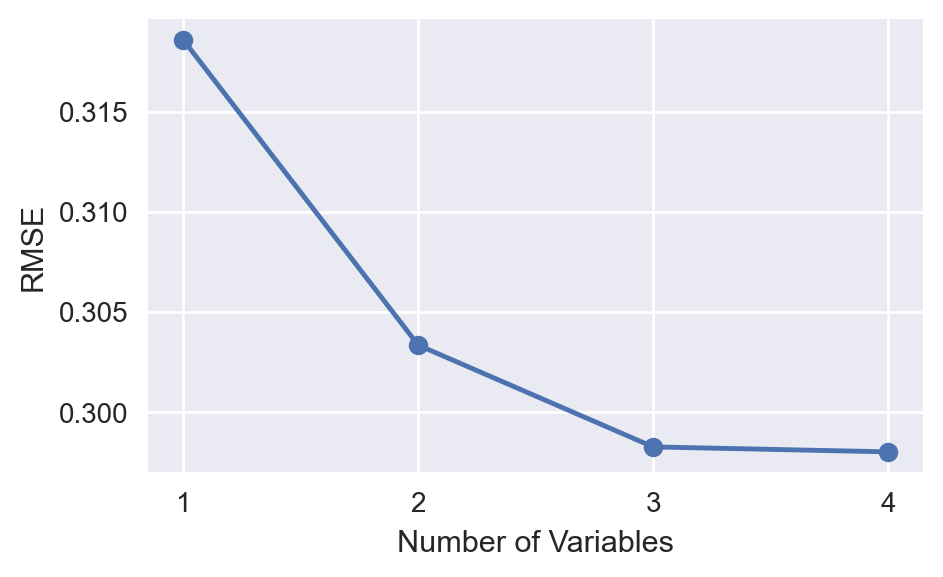

In [30]:
#vars = ['Time', 'T1', 'T2', 'T3', 'T4', 'T5', 'T7', 'T9', 'T10']
#vars = ['Time', 'T1', 'T2', 'T3', 'T4', 'T5', 'T9', 'T10']
#vars = ['Time', 'T1', 'T2', 'T3', 'T5', 'T7', 'T9', 'T10']

#vars = ['Time', 'T1', 'T2', 'T4', 'T5', 'T9', 'T10'] # T5 fortsatt borte
#vars = ['Time', 'T1', 'T2', 'T4', 'T5', 'T10'] # T5 fortsatt borte
vars = ['Time', 'T1', 'T4', 'T5', 'T10']

bs = bs.fit(X_train[vars].drop('Time', axis=1), y_train)
SFS_results(X_train[vars], X_test[vars], y_test, bs, "slettmegpdf")
plot_coefficients(bs, 'ols2', "slettmeg.png")

## Ridge Regression

Best hyperparameters: OrderedDict([('ridge__alpha', 2.2095350994035026)])
--------------------------------------------
Best RMSE on the left out data: 0.07032078830104523
Best RMSE on test: 0.09674903715896178


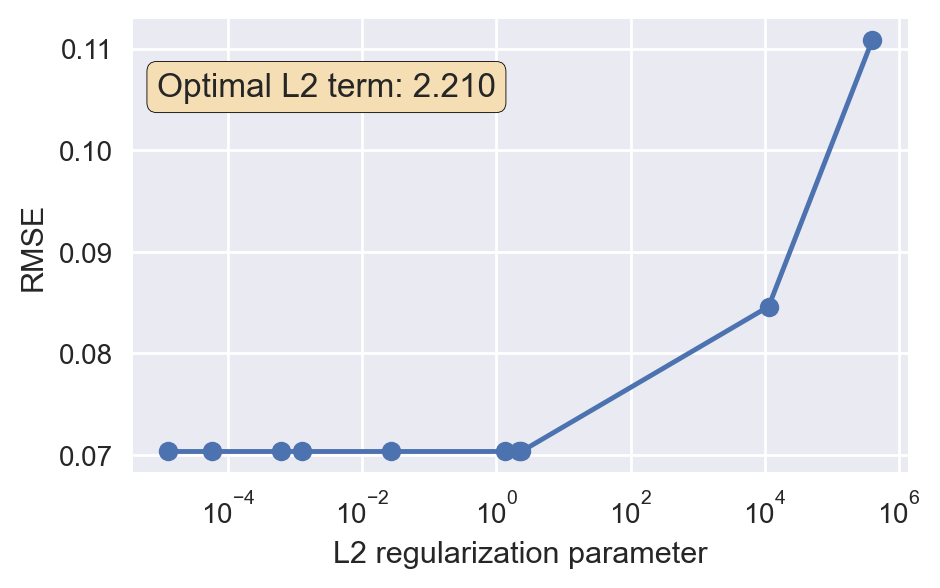

In [31]:
ridge = Ridge()
pipe_ridge = Pipeline([('ridge', ridge)])
bs_ridge = BayesSearchCV(pipe_ridge,
                   {
                        'ridge__alpha': Real(1e-6, 1e+6, prior='log-uniform'),
                   }, 
                   n_iter=10,
                   cv=5, 
                   scoring='neg_root_mean_squared_error',
                   random_state=0)

bs_ridge = bs_ridge.fit(X_train.drop("Time", axis=1), y_train)
BayesSearchCV_results(X_test, y_test, bs_ridge, "Ridge_RMSE_Alpha.pdf")

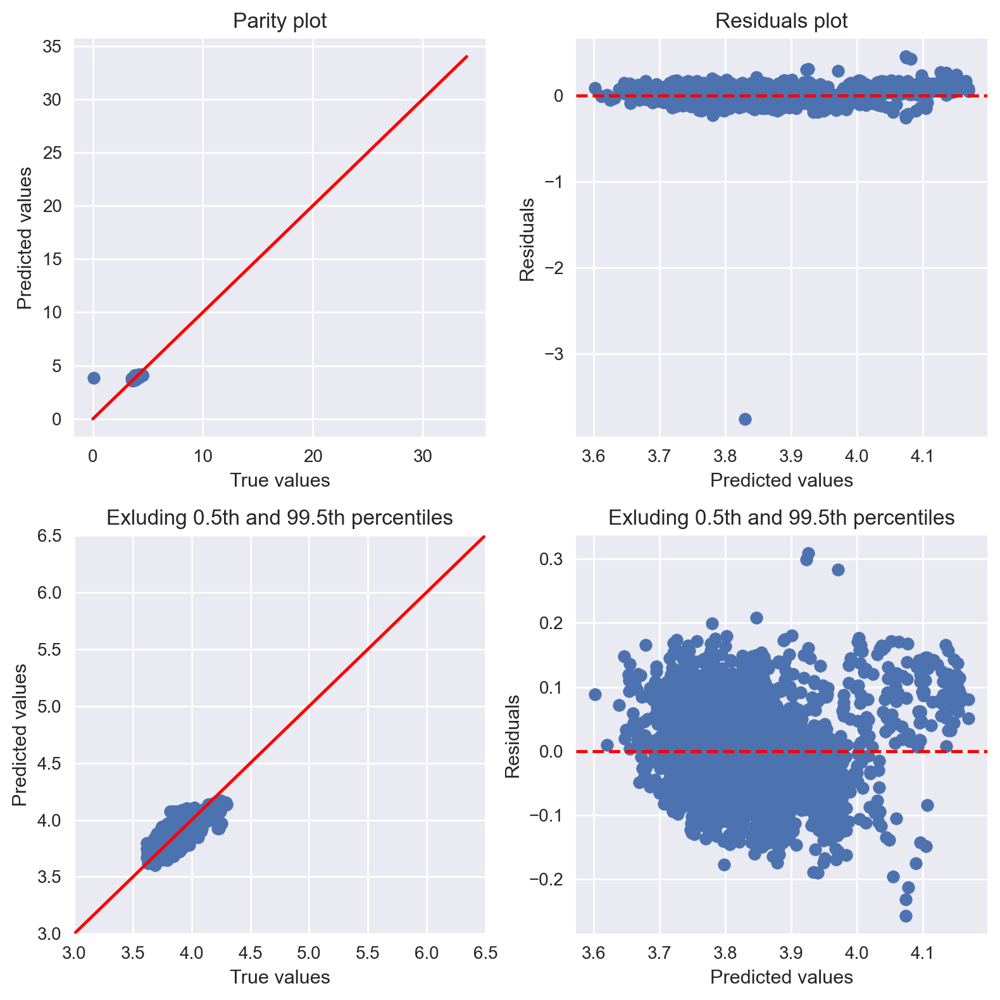

In [32]:
plot_coefficients(bs_ridge, 'ridge', "Ridge_Coefficients.pdf")
plot_parity_residual(X_test, y_test, bs_ridge, "Ridge_Parity_Residuals.pdf", rng=[3, 6.5])
plot_prediction(df, X_train, X_test, bs_ridge)

## Lasso Regression

Best hyperparameters: OrderedDict([('lasso__alpha', 3.5671960745517224e-06)])
--------------------------------------------
Best RMSE on the left out data: 0.07032109067549905
Best RMSE on test: 0.09675116623657103


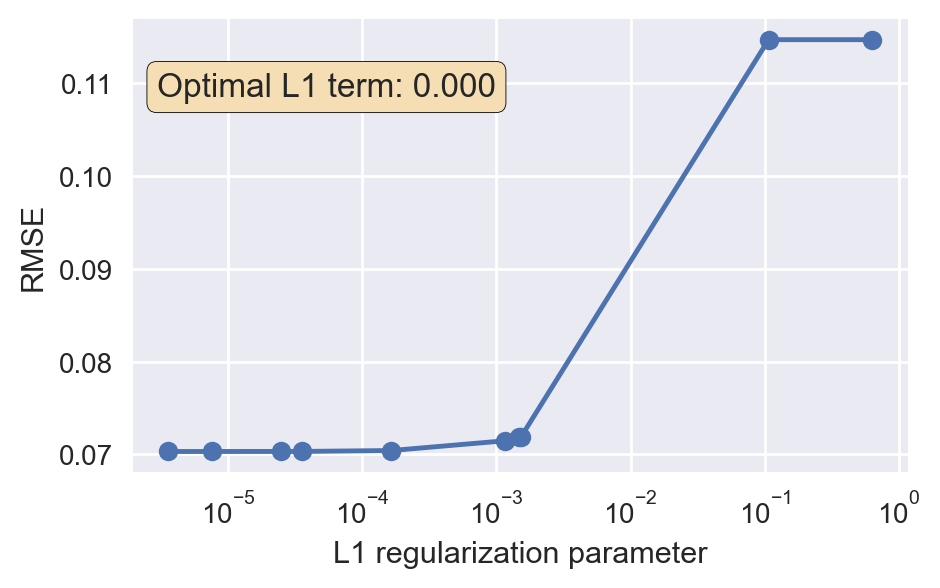

In [33]:
lasso = Lasso()

pipe_lasso = Pipeline([('lasso', lasso)])
bs_lasso = BayesSearchCV(pipe_lasso,
                   {
                        'lasso__alpha': Real(1e-6, 1, prior='log-uniform'),
                   }, 
                   n_iter=10,
                   cv=5, 
                   scoring='neg_root_mean_squared_error',
                   random_state=0)

bs_lasso = bs_lasso.fit(X_train.drop("Time", axis=1), y_train)
BayesSearchCV_results(X_test, y_test, bs_lasso, "Lasso_RMSE_Alpha.pdf")

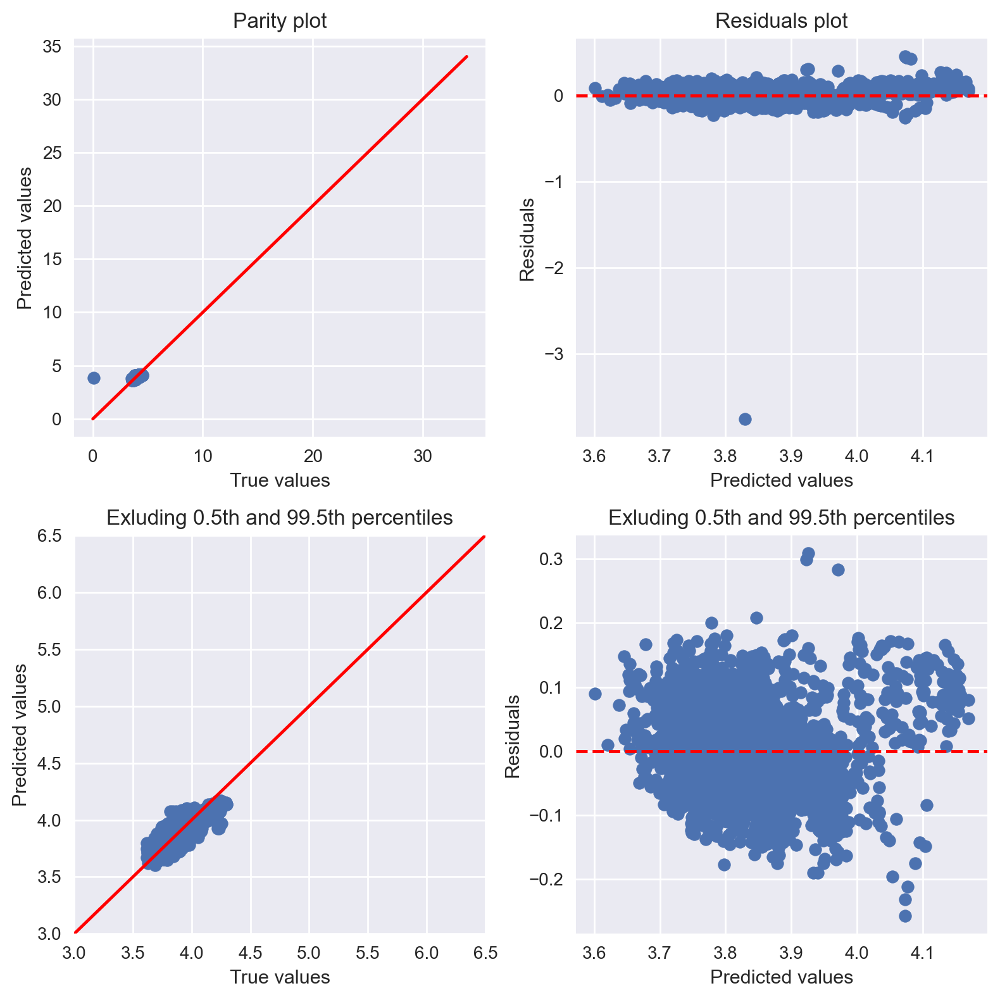

In [34]:
plot_coefficients(bs_lasso, 'lasso', "Lasso_Coefficients.pdf")
plot_parity_residual(X_test, y_test, bs_lasso, "Lasso_Parity_Residuals.pdf", [3, 6.5])
plot_prediction(df, X_train, X_test, bs_lasso)

### Only temperatures

Best hyperparameters: OrderedDict([('lasso__alpha', 3.5671960745517224e-06)])
--------------------------------------------
Best RMSE on the left out data: 0.07512423144511268
Best RMSE on test: 0.100072501622378


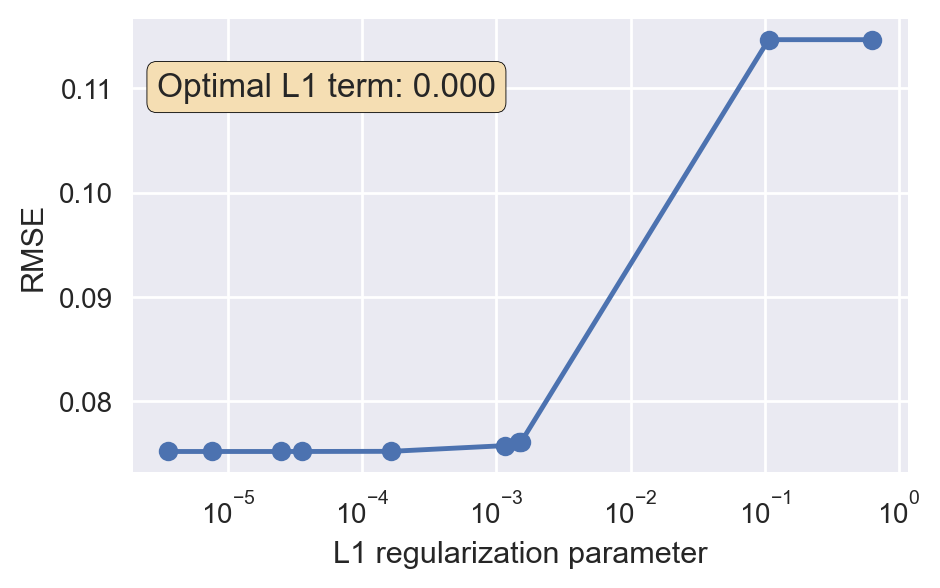

In [35]:
vars = ['Time', 'T1', 'T2', 'T3', 'T4', 'T5', 'T7', 'T9', 'T10']

bs_lasso = bs_lasso.fit(X_train[vars].drop('Time', axis=1), y_train)
BayesSearchCV_results(X_test[vars], y_test, bs_lasso, "slettmeg.pdf")
plot_coefficients(bs_lasso, 'lasso', "slettmegf.pdf")

## Elastic Net

Best hyperparameters: OrderedDict([('elastic_net__alpha', 0.01), ('elastic_net__l1_ratio', 0.01)])
--------------------------------------------
Best RMSE on the left out data: 0.07063944581032702
Best RMSE on test: 0.09694816154838322


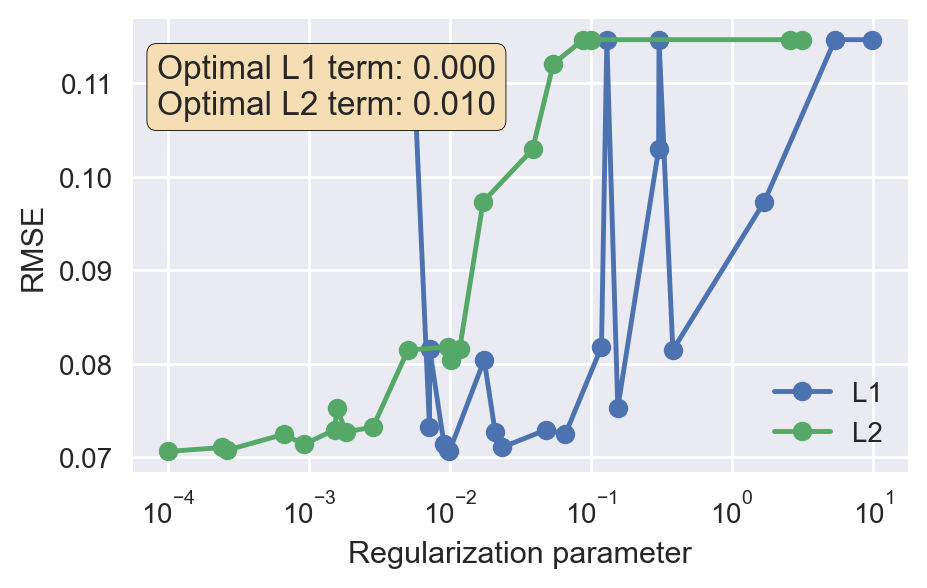

In [36]:
elastic_net = ElasticNet(max_iter=2000)

pipe_elastic_net = Pipeline([('elastic_net', elastic_net)])
bs_elastic_net = BayesSearchCV(pipe_elastic_net,
                   {
                        'elastic_net__alpha': Real(0.01, 10, prior='log-uniform'),
                         'elastic_net__l1_ratio': Real(0.01, 1, prior='log-uniform'),
                   }, 
                   n_iter=20,
                   cv=5, 
                   scoring='neg_root_mean_squared_error',
                   random_state=0)

bs_elastic_net = bs_elastic_net.fit(X_train.drop("Time", axis=1), y_train)
BayesSearchCV_results(X_test, y_test, bs_elastic_net, "ElasticNet_RMSE_Alpha_L1.pdf")

The hyperparameters can be written in form of L1 and L2 penalties as such:

\begin{align*}
    \alpha &= a + b \\
    L1_{ratio} &= \frac{a}{a+b}
\end{align*}

thus giving

\begin{align*}
    a &= \alpha L1_{ratio} \\
    b &= \alpha (1 - L1_{ratio})
\end{align*}

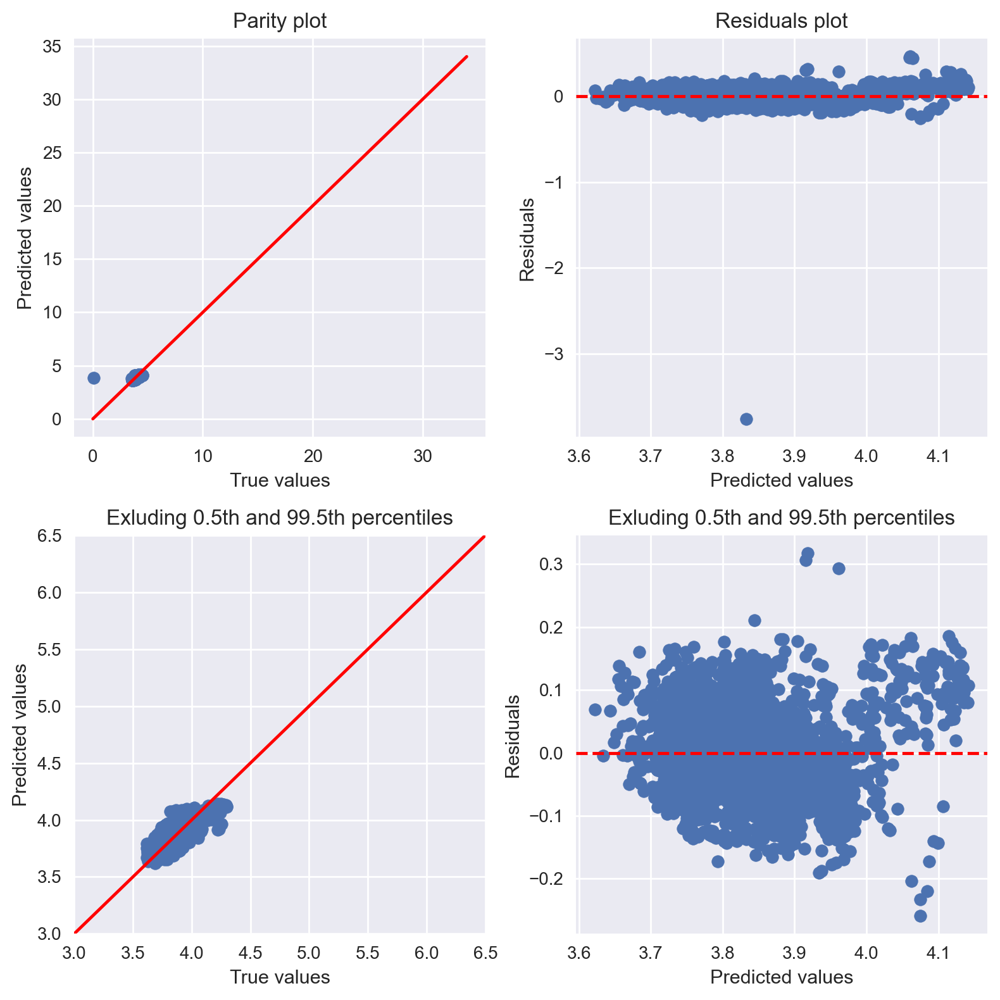

In [37]:
plot_coefficients(bs_elastic_net, 'elastic_net', "ElasticNet_Coefficients.pdf")
plot_parity_residual(X_test, y_test, bs_elastic_net, 'ElasticNet_Partiy_Residuals.pdf', [3, 6.5])
plot_prediction(df, X_train, X_test, bs_elastic_net)

## Partial Least Squares Regression

Best hyperparameters: {'plsr__n_components': 9}
--------------------------------------------
Best RMSE on the left out data: 0.07037438021704533
Best RMSE on test: 0.09677748839820709


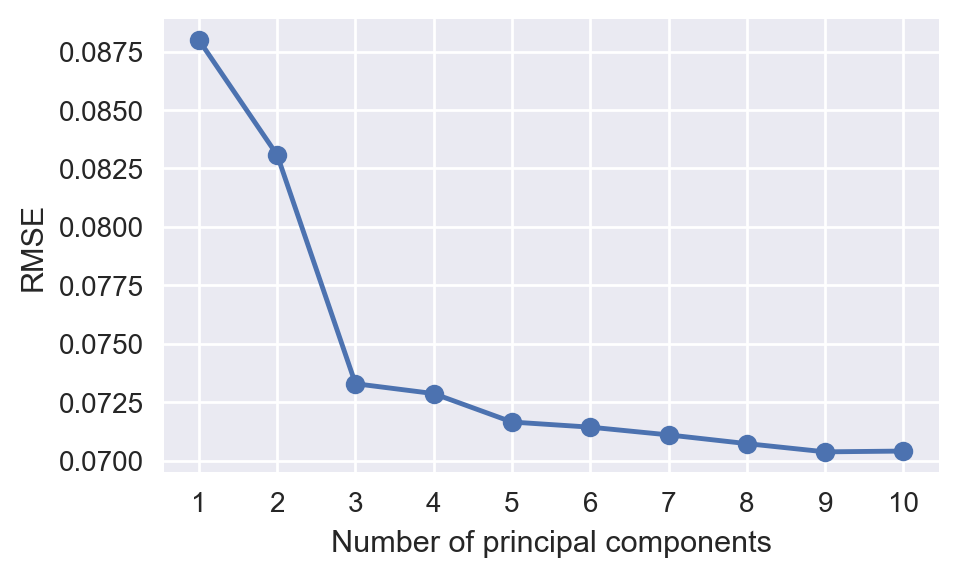

In [38]:
plsr = PLSRegression()
pipe_plsr = Pipeline([('plsr', plsr)])
gs_plsr = GridSearchCV(pipe_plsr,
                   {
                        'plsr__n_components': np.arange(1, 11)
                   }, 
                   cv=5, 
                   scoring='neg_root_mean_squared_error')

gs_plsr = gs_plsr.fit(X_train.drop("Time", axis=1), y_train)
BayesSearchCV_results(X_test, y_test, gs_plsr, "PLSR_RMSE_Components.pdf")

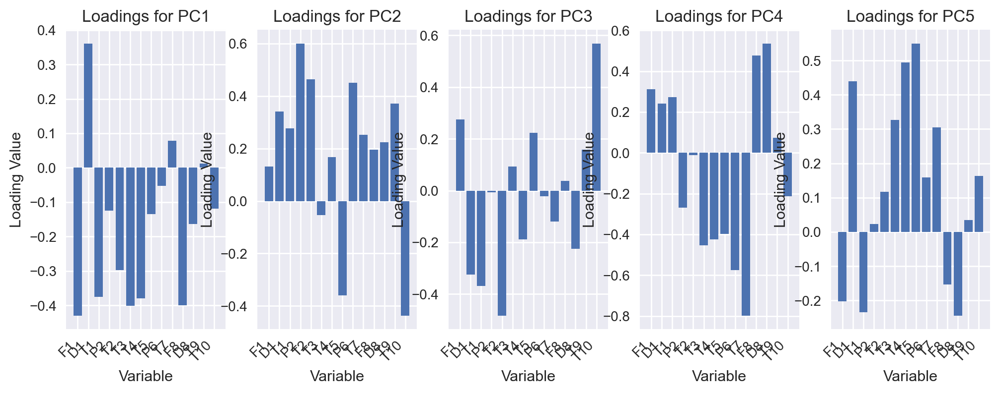

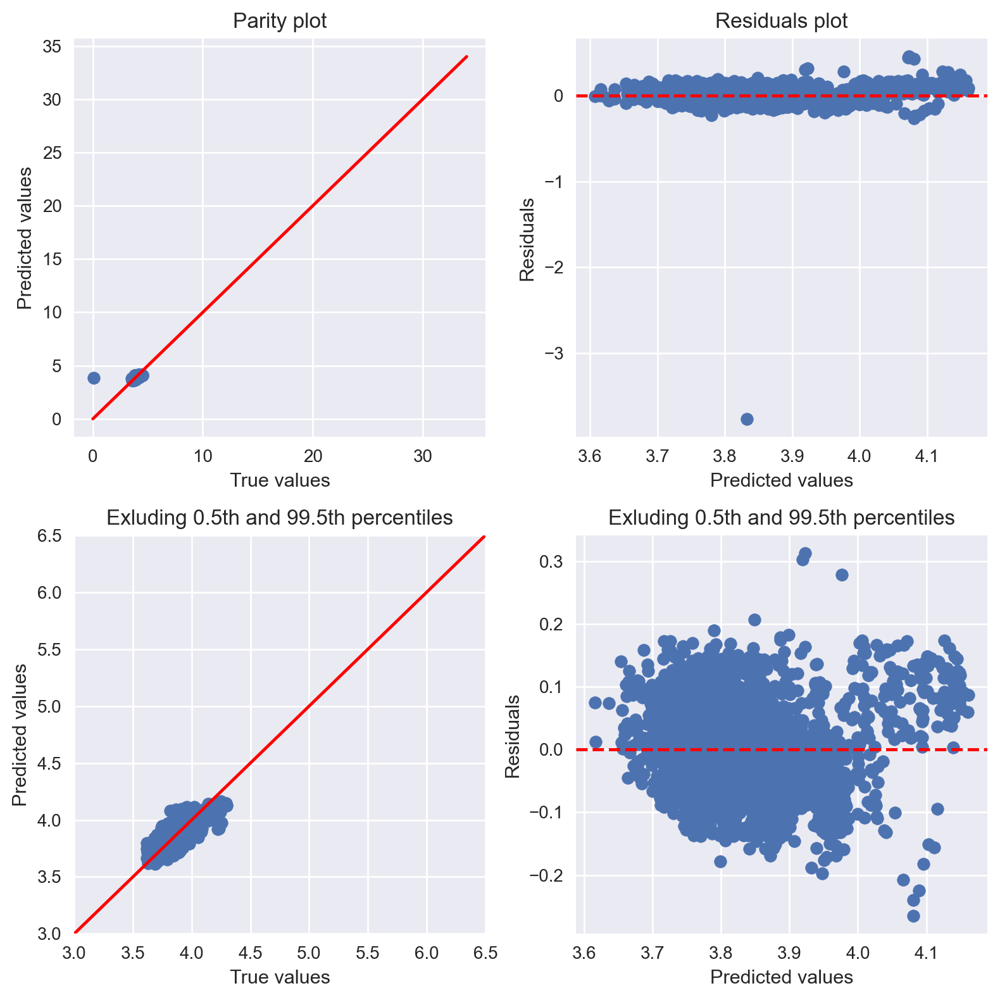

In [39]:
plot_PLS_coefficients(gs_plsr, X_train, "PLSR_Coefficients.pdf", n_components=5)
plot_parity_residual(X_test, y_test, gs_plsr, "PLSR_Parity_Residuals.pdf", [3, 6.5])
#plot_prediction(df, X_train, X_test, gs_plsr)

(12483,)


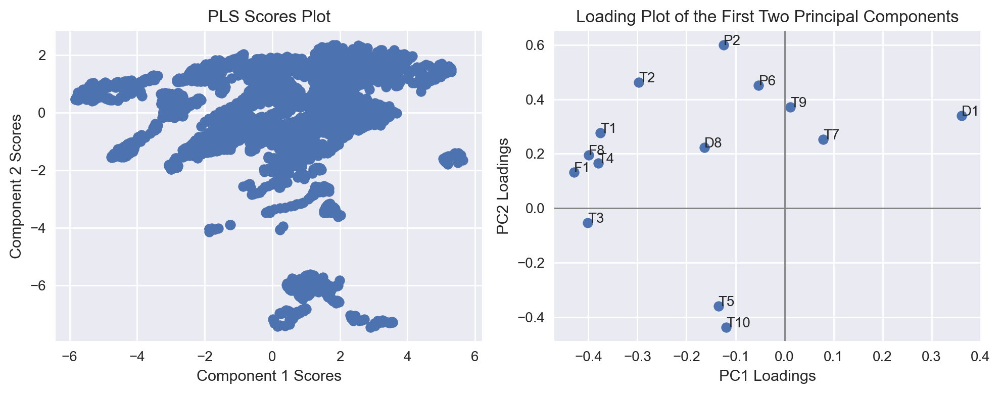

In [40]:
if gs_plsr.best_params_['plsr__n_components'] == 1:
    print("The first principal component explains the most variance in the data")
else:
    x_scores = gs_plsr.best_estimator_.named_steps['plsr'].x_scores_
    x_loadings = gs_plsr.best_estimator_.named_steps['plsr'].x_loadings_
    n = x_loadings.shape[0]
    variable_names = X_train.columns.values[1:]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), dpi=200)

    print(x_scores[:, 0].shape)

    ax1.scatter(x_scores[:, 0], x_scores[:, 1])
    ax1.set_title('PLS Scores Plot')
    ax1.set_xlabel('Component 1 Scores')
    ax1.set_ylabel('Component 2 Scores')

    ax2.scatter(x_loadings[:, 0], x_loadings[:, 1])
    for i, txt in enumerate(variable_names):
        ax2.annotate(txt, (x_loadings[i, 0], x_loadings[i, 1]))

    ax2.axhline(0, color='grey', lw=1)
    ax2.axvline(0, color='grey', lw=1)
    ax2.set_xlabel('PC1 Loadings')
    ax2.set_ylabel('PC2 Loadings')
    ax2.set_title('Loading Plot of the First Two Principal Components')

    plt.tight_layout()
    plt.show()

## Only temperatures

/Users/junxingli/opt/anaconda3/envs/XingPythonKernel/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning:


10 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "/Users/junxingli/opt/anaconda3/envs/XingPythonKernel/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/junxingli/opt/anaconda3/envs/XingPythonKernel/lib/python3.8/site-packages/sklearn/pipeline.py", line 382, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/Users/junxingli/opt/anaconda3/envs/X

Best hyperparameters: {'plsr__n_components': 7}
--------------------------------------------
Best RMSE on the left out data: 0.07508370052241219
Best RMSE on test: 0.10007710729154416


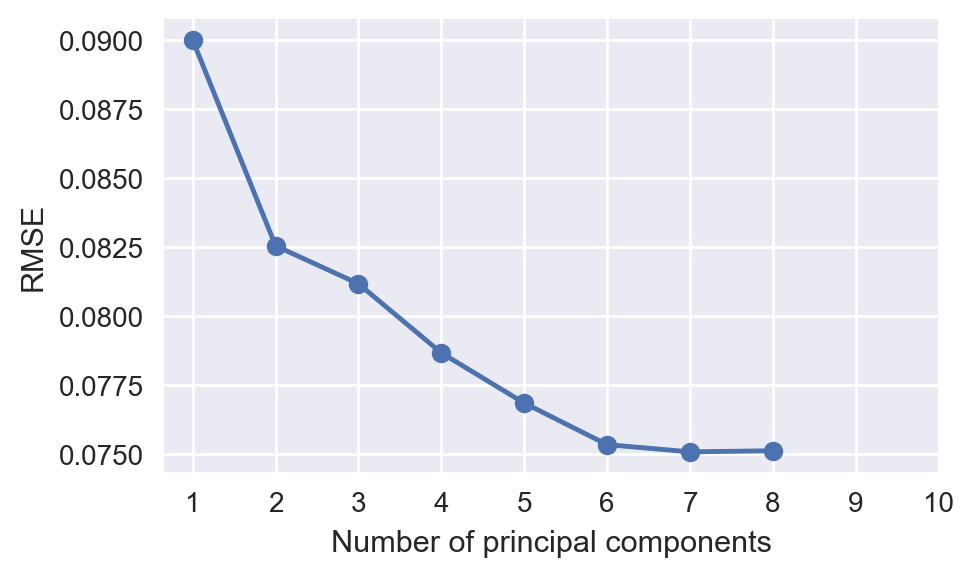

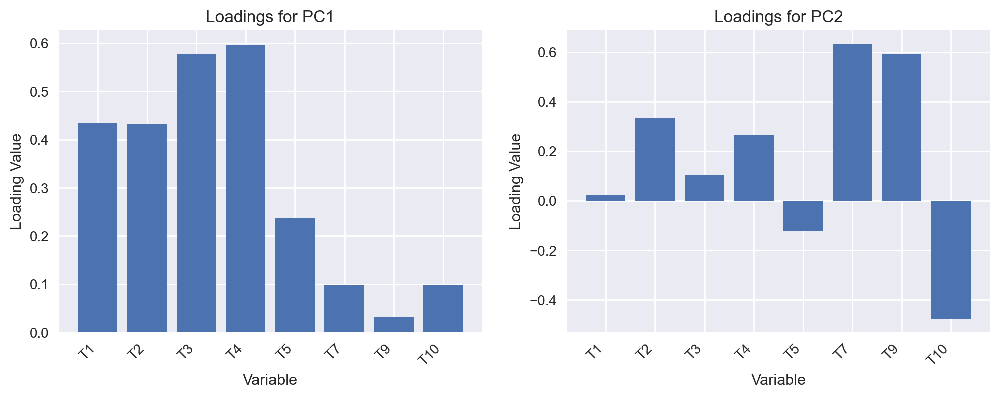

In [41]:
vars = ['Time', 'T1', 'T2', 'T3', 'T4', 'T5', 'T7', 'T9', 'T10']

gs_plsr = gs_plsr.fit(X_train[vars].drop('Time', axis=1), y_train)
BayesSearchCV_results(X_test[vars], y_test, gs_plsr, "slettmegpdf")
plot_PLS_coefficients(gs_plsr, X_train[vars], "slettmeg", n_components=2)

## Using two separate models

In [42]:
df = pd.read_pickle("../data/processed/renamed_Lysekil.pkl")

X = df.drop(['U7', 'F10'], axis=1)
y = df[['U7', 'F10']]

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.20, 
                                                    random_state=0,
                                                    shuffle=True)

scaler = StandardScaler()
cols = [col for col in X_train.columns if col != 'Time']
X_train[cols] = scaler.fit_transform(X_train[cols])
X_test[cols] = scaler.transform(X_test[cols])

U7_train, F10_train = y_train['U7'], y_train['F10']
U7_test, F10_test = y_test['U7'], y_test['F10']
y_test = 3.6 * y_test['U7'] / y_test['F10']

In [43]:
from sklearn.metrics import mean_squared_error

def makeOLS(X_train, y_train):
    sfs = SFS(ols1, 
            k_features='best', 
            forward=False, 
            scoring='neg_root_mean_squared_error', 
            cv=5, 
            n_jobs=-1)

    pipe = Pipeline([('sfs', sfs), 
                    ('ols2', ols2)])

    bs = BayesSearchCV(pipe,
                    {
                            'sfs__forward': [True, False],
                            'sfs__floating': [True, False],
                    }, 
                    n_iter=1,
                    cv=5, 
                    scoring='neg_root_mean_squared_error',
                    random_state=0)

    bs = bs.fit(X_train.drop("Time", axis=1), y_train)
    return bs


def makeRidge(X_train, y_train):
    ridge = Ridge()
    pipe = Pipeline([('ridge', ridge)])
    bs = BayesSearchCV(pipe,
                    {
                            'ridge__alpha': Real(1e-6, 1e+6, prior='log-uniform'),
                    }, 
                    n_iter=10,
                    cv=5, 
                    scoring='neg_root_mean_squared_error',
                    random_state=0)
    bs = bs.fit(X_train.drop("Time", axis=1), y_train)
    return bs


def makeLasso(X_train, y_train):
    lasso = Lasso(max_iter=2000)
    pipe = Pipeline([('lasso', lasso)])
    bs = BayesSearchCV(pipe,
                        {
                                'lasso__alpha': Real(0.001, 1, prior='log-uniform'),
                        }, 
                        n_iter=10,
                        cv=5, 
                        scoring='neg_root_mean_squared_error',
                        random_state=0)
    bs = bs.fit(X_train.drop("Time", axis=1), y_train)
    return bs


def makeElasticNet(X_train, y_train):
    elastic_net = ElasticNet(max_iter=2000)
    pipe = Pipeline([('elastic_net', elastic_net)])
    bs = BayesSearchCV(pipe,
                    {
                            'elastic_net__alpha': Real(0.01, 10, prior='log-uniform'),
                            'elastic_net__l1_ratio': Real(0.01, 1, prior='log-uniform'),
                    }, 
                    n_iter=20,
                    cv=5, 
                    scoring='neg_root_mean_squared_error',
                    random_state=0)
    bs = bs.fit(X_train.drop("Time", axis=1), y_train)
    return bs


def makePLSR(X_train, y_train):
    plsr = PLSRegression()
    pipe = Pipeline([('plsr', plsr)])
    gs = GridSearchCV(pipe,
                    {
                            'plsr__n_components': np.arange(1, 11)
                    }, 
                    cv=5, 
                    scoring='neg_root_mean_squared_error')
    gs = gs.fit(X_train.drop("Time", axis=1), y_train)
    return gs


def twoModelsResults(model, X_train, U7_train, F10_train, X_test, y_test):
    bs_U7 = model(X_train, U7_train)
    bs_F10 = model(X_train, F10_train)
    
    U7_train_pred = bs_U7.predict(X_train.drop('Time', axis=1))
    F10_train_pred = bs_F10.predict(X_train.drop('Time', axis=1))
    SRD_train_pred = 3.6 * U7_train_pred / F10_train_pred
    y_train = 3.6 * U7_train / F10_train
    train_RMSE = mean_squared_error(y_train, SRD_train_pred, squared=False)

    
    U7_pred = bs_U7.predict(X_test.drop('Time', axis=1))
    F10_pred = bs_F10.predict(X_test.drop('Time', axis=1))
    SRD_pred = 3.6 * U7_pred / F10_pred
    test_RMSE = mean_squared_error(y_test, SRD_pred, squared=False)
    
    print("\nModel name:", model.__name__)
    print(f"Train RMSE: {train_RMSE:.3f}")
    print(f"Test RMSE:  {test_RMSE:.3f}")

In [44]:
models = [makeOLS, makeRidge, makeLasso, makeElasticNet, makePLSR]

for model in models:
    twoModelsResults(model, X_train, U7_train, F10_train, X_test, y_test)


Model name: makeOLS
Train RMSE: 0.812
Test RMSE:  0.686

Model name: makeRidge
Train RMSE: 0.813
Test RMSE:  0.686


/Users/junxingli/opt/anaconda3/envs/XingPythonKernel/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.341e+04, tolerance: 1.292e+02

/Users/junxingli/opt/anaconda3/envs/XingPythonKernel/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.383e+04, tolerance: 1.273e+02

/Users/junxingli/opt/anaconda3/envs/XingPythonKernel/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation.


Model name: makeLasso
Train RMSE: 0.813
Test RMSE:  0.689


/Users/junxingli/opt/anaconda3/envs/XingPythonKernel/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning:

The objective has been evaluated at this point before.

/Users/junxingli/opt/anaconda3/envs/XingPythonKernel/lib/python3.8/site-packages/skopt/optimizer/optimizer.py:449: UserWarning:

The objective has been evaluated at this point before.




Model name: makeElasticNet
Train RMSE: 0.813
Test RMSE:  0.689

Model name: makePLSR
Train RMSE: 0.814
Test RMSE:  0.687


# PCA for temperatures

Observing the coefficients from the previous models, the sensor $T5$ is often disregarded in terms of making a predictive model, we will now perform PCA on the selected variables in order to determine the underlying cause behind this observation

In [45]:
pca.explained_variance_ratio_

array([0.3391595 , 0.22795357, 0.21798957, 0.10798493, 0.03421059,
       0.02855557, 0.01390197, 0.0114145 ])

In [46]:
var_names = ['T1', 'T2', 'T3', 'T4', 'T5', 'T7', 'T9', 'T10', 'SRD']
pca_scaler = StandardScaler()
df_PCA = df[var_names].copy()
df_PCA = pca_scaler.fit_transform(df_PCA)

n = 8
pca = PCA(n_components=n)
pca.fit(df_PCA)
scores = pca.transform(df_PCA)
loadings = pca.components_

exp_var_cumul = np.cumsum(pca.explained_variance_ratio_)
fig, axs = plt.subplots(2, 2, figsize=(15, 10), dpi=300)

# Plot 1: Explained Variance vs. Number of Components
axs[0, 0].plot(range(1, n+1), exp_var_cumul)
axs[0, 0].scatter(range(1, n+1), exp_var_cumul, marker='o')
axs[0, 0].set_xlabel("# Components")
axs[0, 0].set_ylabel("Explained Variance")
axs[0, 0].set_title("Explained Variance vs. Number of Components")

# Plot 2: Explained Variance of Principal Components, Pie Chart
axs[0, 1].pie(pca.explained_variance_ratio_, labels=range(1, n+1), autopct='%1.1f%%')
axs[0, 1].set_title("Explained Variance of Principal Components")

# Plot 3: Scores Plot
axs[1, 0].scatter(scores[:, 0], scores[:, 1])

axs[1, 0].set_xlabel("PC1 Scores")
axs[1, 0].set_ylabel("PC2 Scores")
axs[1, 0].set_title("Scores Plot")

# Plot 4: Loadings Plot
PC1_var = pca.explained_variance_ratio_[0] * 100
PC2_var = pca.explained_variance_ratio_[1] * 100
axs[1, 1].scatter(loadings[0], loadings[1])
for i, txt in enumerate(var_names):
    axs[1, 1].annotate(txt, (loadings[0, i], loadings[1, i]))

axs[1, 1].axhline(0, color='grey', lw=1)
axs[1, 1].axvline(0, color='grey', lw=1)
axs[1, 1].set_xlabel('PC1 Loadings({:.1f}%)'.format(PC1_var))
axs[1, 1].set_ylabel('PC2 Loadings({:.1f}%)'.format(PC2_var))
axs[1, 1].set_title('Loadings Plot')

plt.subplots_adjust(wspace=0.3, hspace=0.4)
plt.tight_layout()
plt.show()


KeyError: "['SRD'] not in index"

In [ ]:
var_names = df.drop('Time', axis=1).columns
pca_scaler = StandardScaler()
df_PCA = df.drop('Time', axis=1).copy()
df_PCA = pca_scaler.fit_transform(df_PCA)

n = 8
pca = PCA(n_components=n)
pca.fit(df_PCA)
scores = pca.transform(df_PCA)
loadings = pca.components_

exp_var_cumul = np.cumsum(pca.explained_variance_ratio_)
fig, axs = plt.subplots(2, 2, figsize=(15, 10), dpi=300)

# Plot 1: Explained Variance vs. Number of Components
axs[0, 0].plot(range(1, n+1), exp_var_cumul)
axs[0, 0].scatter(range(1, n+1), exp_var_cumul, marker='o')
axs[0, 0].set_xlabel("# Components")
axs[0, 0].set_ylabel("Explained Variance")
axs[0, 0].set_title("Explained Variance vs. Number of Components")

# Plot 2: Explained Variance of Principal Components, Pie Chart
axs[0, 1].pie(pca.explained_variance_ratio_, labels=range(1, n+1), autopct='%1.1f%%')
axs[0, 1].set_title("Explained Variance of Principal Components")

# Plot 3: Scores Plot
axs[1, 0].scatter(scores[:, 0], scores[:, 1])

axs[1, 0].set_xlabel("PC1 Scores")
axs[1, 0].set_ylabel("PC2 Scores")
axs[1, 0].set_title("Scores Plot")

# Plot 4: Loadings Plot
PC1_var = pca.explained_variance_ratio_[0] * 100
PC2_var = pca.explained_variance_ratio_[1] * 100
axs[1, 1].scatter(loadings[0], loadings[1])
for i, txt in enumerate(var_names):
    axs[1, 1].annotate(txt, (loadings[0, i], loadings[1, i]))

axs[1, 1].axhline(0, color='grey', lw=1)
axs[1, 1].axvline(0, color='grey', lw=1)
axs[1, 1].set_xlabel('PC1 Loadings({:.1f}%)'.format(PC1_var))
axs[1, 1].set_ylabel('PC2 Loadings({:.1f}%)'.format(PC2_var))
axs[1, 1].set_title('Loadings Plot')

plt.subplots_adjust(wspace=0.3, hspace=0.4)
plt.tight_layout()
plt.show()
